# MTA Token Allocation
In July 2020 the mStable team issued 100m MTA. The allocations were as follows:

Investors and Partnerships - 20,183,300 (20.2%)

Team & Advisors - 15,464,000 (15.5%)

Institutional Liquidity Mining - 6,724,200 (6.7%)

Future Contributors Reserve - 3,462,500 (3.5%)

Mesa Auction and Balancer Pool Seeding - 3,166,000 (3.2%)

Public Rewards and Staking Reserve - 51,000,000 (51.0%)



So there will be around 3,500,000 millions of tokens for the contributors reserve

In [2]:
import pandas as pd
import numpy as np

import plotly 
import plotly.graph_objs as go

import plotly.express as px
import matplotlib.pyplot as plt

import plotly.io as pio
pio.renderers.default='notebook'


In [5]:
trt = pd.read_csv('../datasets/mstable/mstable_transhist.csv')

trt.shape

(274316, 9)

In [6]:
tr = pd.read_csv('../datasets/mstable/mstable_treasury.csv')

tr

,Txhash,Blockno,UnixTimestamp,DateTime,From,To,Quantity,Method
0,0x778e2aae51330549184b68c2ec9466d4fe0b2704edc5...,13813070,1639615683,2021-12-16 00:48:03,0xba69e6fc7df49a3b75b565068fb91ff2d9d91780,0x4b27bad829092229d2461633a3c08e284bdcbc3a,"10,915.040864846997699756",Distribute Rewards
1,0x778e2aae51330549184b68c2ec9466d4fe0b2704edc5...,13813070,1639615683,2021-12-16 00:48:03,0x4b27bad829092229d2461633a3c08e284bdcbc3a,0x3dd46846eed8d147841ae162c8425c08bd8e1b41,"10,915.040864846997699756",Distribute Rewards
2,0x4b01fdd8ca5b7235742f767d37c6b9bc17506fe37cd1...,13859058,1640230448,2021-12-23 03:34:08,0xba69e6fc7df49a3b75b565068fb91ff2d9d91780,0x4b27bad829092229d2461633a3c08e284bdcbc3a,"9,885.642801240488748452",Distribute Rewards
3,0x4b01fdd8ca5b7235742f767d37c6b9bc17506fe37cd1...,13859058,1640230448,2021-12-23 03:34:08,0x4b27bad829092229d2461633a3c08e284bdcbc3a,0x3dd46846eed8d147841ae162c8425c08bd8e1b41,"9,885.642801240488748452",Distribute Rewards
4,0xee3c9fb3b3b1375b2d20b16831ca45c9f00efdf742c9...,13903484,1640824318,2021-12-30 00:31:58,0xba69e6fc7df49a3b75b565068fb91ff2d9d91780,0x4b27bad829092229d2461633a3c08e284bdcbc3a,"10,940.617054402054153116",Distribute Rewards
5,0xee3c9fb3b3b1375b2d20b16831ca45c9f00efdf742c9...,13903484,1640824318,2021-12-30 00:31:58,0x4b27bad829092229d2461633a3c08e284bdcbc3a,0x3dd46846eed8d147841ae162c8425c08bd8e1b41,"10,940.617054402054153116",Distribute Rewards
6,0xce31ba8fe8ba45d89205088cc564bb1444333de2e78e...,13948758,1641429688,2022-01-06 00:41:28,0xba69e6fc7df49a3b75b565068fb91ff2d9d91780,0x4b27bad829092229d2461633a3c08e284bdcbc3a,"9,234.754988363647549206",Distribute Rewards
7,0xce31ba8fe8ba45d89205088cc564bb1444333de2e78e...,13948758,1641429688,2022-01-06 00:41:28,0x4b27bad829092229d2461633a3c08e284bdcbc3a,0x3dd46846eed8d147841ae162c8425c08bd8e1b41,"9,234.754988363647549206",Distribute Rewards
8,0xff2ccd0d77915a0ad0502d53005046cb4cd8d6bb207c...,13994009,1642034365,2022-01-13 00:39:25,0xba69e6fc7df49a3b75b565068fb91ff2d9d91780,0x4b27bad829092229d2461633a3c08e284bdcbc3a,"7,229.002855255812686798",Distribute Rewards
9,0xff2ccd0d77915a0ad0502d53005046cb4cd8d6bb207c...,13994009,1642034365,2022-01-13 00:39:25,0x4b27bad829092229d2461633a3c08e284bdcbc3a,0x3dd46846eed8d147841ae162c8425c08bd8e1b41,"7,229.002855255812686798",Distribute Rewards


# Cleaning the data

In [5]:
trt = trt.drop(columns='Unnamed: 0')

In [6]:
trt['From_ID'] = trt['From'].str[-5:]
trt['To_ID'] = trt['To'].str[-5:]

trt

,Txhash,Blockno,UnixTimestamp,DateTime,From,To,Quantity,Method,From_ID,To_ID
0,0x998c0f49c32ecf1bb76378c6ecc92a9ea52ab9a161a3...,10450640,1594635836,2020-07-13 10:23:56,0x0000000000000000000000000000000000000000,0x19f12c947d25ff8a3b748829d8001ca09a28d46d,"100,000,000",-,00000,8d46d
1,0xb5cc04a1eeca79ab540357804b3c76eee7d61a38bb24...,10450649,1594636020,2020-07-13 10:27:00,0x19f12c947d25ff8a3b748829d8001ca09a28d46d,0x0a0bbf3d159883bc7c9b6456d6888023a8265aad,"100,000,000",Deposit,8d46d,65aad
2,0xb5cc04a1eeca79ab540357804b3c76eee7d61a38bb24...,10450649,1594636020,2020-07-13 10:27:00,0x0a0bbf3d159883bc7c9b6456d6888023a8265aad,0xb8541e73aa47a847fa39e803d19a3f9b1bbc5a6c,"100,000,000",Deposit,65aad,c5a6c
3,0x662b71919cc53c617d2d5c600240e6bafcf49beec5b4...,10476280,1594980226,2020-07-17 10:03:46,0xb8541e73aa47a847fa39e803d19a3f9b1bbc5a6c,0x4186c5aed424876f7ebe52f9148552a45e17f287,"60,000,000",Vote,c5a6c,7f287
4,0xd8b4a056f73a7f43eb7faeb31231579bcd02dcee5c5f...,10476285,1594980319,2020-07-17 10:05:19,0xb8541e73aa47a847fa39e803d19a3f9b1bbc5a6c,0xd8bae7d96df905e46718b6cee3410f535e11bf20,"5,000,000",Vote,c5a6c,1bf20
...,...,...,...,...,...,...,...,...,...,...
303628,0x5eca2774aeb519a5a10fd30006a725a74c9c3813c5d9...,14538449,1649330644,2022-04-07 11:24:04,0x0d0d65e7a7db277d3e0f5e1676325e75f3340455,0xa571a1d02157a8a3ef2d8600c5a32ba19e25b768,"5,406.204860041342308334",-,40455,5b768
303629,0x5eca2774aeb519a5a10fd30006a725a74c9c3813c5d9...,14538449,1649330644,2022-04-07 11:24:04,0xa571a1d02157a8a3ef2d8600c5a32ba19e25b768,0xba12222222228d8ba445958a75a0704d566bf2c8,"5,406.204860041342308334",-,5b768,bf2c8
303630,0x6c15cf29de15039736f6d6a4705be29d7c9c51a4a4c7...,14538513,1649331649,2022-04-07 11:40:49,0xf07704777d6bc182bf2c67fbda48913169b84983,0x0d0d65e7a7db277d3e0f5e1676325e75f3340455,"6,981.360120911092600412",Swap Tokens For Exact Tokens,84983,40455
303631,0xe4b2d6f58805ffbb9c0efb20b00595b913270c247cbb...,14538801,1649335376,2022-04-07 12:42:56,0xe93381fb4c4f14bda253907b18fad305d799241a,0xbc53b706b165d2b7e98f254095d9d342e845e5ac,"22,316",Transfer,9241a,5e5ac


In [7]:
trt['DateTime'] = pd.to_datetime(trt['DateTime'])
trt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303633 entries, 0 to 303632
Data columns (total 10 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   Txhash         303633 non-null  object        
 1   Blockno        303633 non-null  int64         
 2   UnixTimestamp  303633 non-null  int64         
 3   DateTime       303633 non-null  datetime64[ns]
 4   From           303633 non-null  object        
 5   To             303633 non-null  object        
 6   Quantity       303633 non-null  object        
 7   Method         303633 non-null  object        
 8   From_ID        303633 non-null  object        
 9   To_ID          303633 non-null  object        
dtypes: datetime64[ns](1), int64(2), object(7)
memory usage: 23.2+ MB


### Quantity variable

In [8]:
pd.set_option('display.float_format', lambda x: '%.5f' % x)
#pd.reset_option('display.float_format')  this one is to reset to normal

In [9]:
trt.Quantity = trt.Quantity.apply(lambda x : x.replace(',',''))
#trt.Quantity = pd.to_numeric(trt['Quantity'])
#trt.Quantity = trt.Quantity.round()
trt = trt.astype({'Quantity':'float'})
trt.Quantity

0        100000000.00000
1        100000000.00000
2        100000000.00000
3         60000000.00000
4          5000000.00000
               ...      
303628        5406.20486
303629        5406.20486
303630        6981.36012
303631       22316.00000
303632       22316.00000
Name: Quantity, Length: 303633, dtype: float64

## Creating new variables

### Weekday

In [10]:
trt['Weekday'] = trt['DateTime'].dt.dayofweek

### Month

In [11]:
trt['Month'] = trt['DateTime'].dt.to_period('M')

### week/year

In [12]:
trt

,Txhash,Blockno,UnixTimestamp,DateTime,From,To,Quantity,Method,From_ID,To_ID,Weekday,Month
0,0x998c0f49c32ecf1bb76378c6ecc92a9ea52ab9a161a3...,10450640,1594635836,2020-07-13 10:23:56,0x0000000000000000000000000000000000000000,0x19f12c947d25ff8a3b748829d8001ca09a28d46d,100000000.00000,-,00000,8d46d,0,2020-07
1,0xb5cc04a1eeca79ab540357804b3c76eee7d61a38bb24...,10450649,1594636020,2020-07-13 10:27:00,0x19f12c947d25ff8a3b748829d8001ca09a28d46d,0x0a0bbf3d159883bc7c9b6456d6888023a8265aad,100000000.00000,Deposit,8d46d,65aad,0,2020-07
2,0xb5cc04a1eeca79ab540357804b3c76eee7d61a38bb24...,10450649,1594636020,2020-07-13 10:27:00,0x0a0bbf3d159883bc7c9b6456d6888023a8265aad,0xb8541e73aa47a847fa39e803d19a3f9b1bbc5a6c,100000000.00000,Deposit,65aad,c5a6c,0,2020-07
3,0x662b71919cc53c617d2d5c600240e6bafcf49beec5b4...,10476280,1594980226,2020-07-17 10:03:46,0xb8541e73aa47a847fa39e803d19a3f9b1bbc5a6c,0x4186c5aed424876f7ebe52f9148552a45e17f287,60000000.00000,Vote,c5a6c,7f287,4,2020-07
4,0xd8b4a056f73a7f43eb7faeb31231579bcd02dcee5c5f...,10476285,1594980319,2020-07-17 10:05:19,0xb8541e73aa47a847fa39e803d19a3f9b1bbc5a6c,0xd8bae7d96df905e46718b6cee3410f535e11bf20,5000000.00000,Vote,c5a6c,1bf20,4,2020-07
...,...,...,...,...,...,...,...,...,...,...,...,...
303628,0x5eca2774aeb519a5a10fd30006a725a74c9c3813c5d9...,14538449,1649330644,2022-04-07 11:24:04,0x0d0d65e7a7db277d3e0f5e1676325e75f3340455,0xa571a1d02157a8a3ef2d8600c5a32ba19e25b768,5406.20486,-,40455,5b768,3,2022-04
303629,0x5eca2774aeb519a5a10fd30006a725a74c9c3813c5d9...,14538449,1649330644,2022-04-07 11:24:04,0xa571a1d02157a8a3ef2d8600c5a32ba19e25b768,0xba12222222228d8ba445958a75a0704d566bf2c8,5406.20486,-,5b768,bf2c8,3,2022-04
303630,0x6c15cf29de15039736f6d6a4705be29d7c9c51a4a4c7...,14538513,1649331649,2022-04-07 11:40:49,0xf07704777d6bc182bf2c67fbda48913169b84983,0x0d0d65e7a7db277d3e0f5e1676325e75f3340455,6981.36012,Swap Tokens For Exact Tokens,84983,40455,3,2022-04
303631,0xe4b2d6f58805ffbb9c0efb20b00595b913270c247cbb...,14538801,1649335376,2022-04-07 12:42:56,0xe93381fb4c4f14bda253907b18fad305d799241a,0xbc53b706b165d2b7e98f254095d9d342e845e5ac,22316.00000,Transfer,9241a,5e5ac,3,2022-04


In [13]:
#CHECK ON THE METHODS
#trt.loc[trt['Method'] == 'Transfer To Owner']

In [14]:
#CHECK ON GNOSIS SAFE WALLET

trt.loc[trt['From'] == '0x3dd46846eed8d147841ae162c8425c08bd8e1b41']

,Txhash,Blockno,UnixTimestamp,DateTime,From,To,Quantity,Method,From_ID,To_ID,Weekday,Month
217895,0x896a9789686d2bdd6369ed16b0432d79daf9223c3098...,11868176,1613482939,2021-02-16 13:42:19,0x3dd46846eed8d147841ae162c8425c08bd8e1b41,0x5ed2a924cd735d725fcca11180f7b682e614e70a,2591.60000,Exec Transaction,e1b41,4e70a,1,2021-02
217897,0x0a8be821ef1affa64333a06eec90aff446b1d1bc0d4a...,11868189,1613483162,2021-02-16 13:46:02,0x3dd46846eed8d147841ae162c8425c08bd8e1b41,0x87a4f91dfc400b44bcae04f7025789642af85611,40244.60000,Exec Transaction,e1b41,85611,1,2021-02
223176,0x9581d66e948111fa7e71000fa22a0753e30fd0637d69...,11964704,1614766884,2021-03-03 10:21:24,0x3dd46846eed8d147841ae162c8425c08bd8e1b41,0x437e8c54db5c66bb3d80d2ff156e9bfe31a017db,641758.00000,Exec Transaction,e1b41,017db,2,2021-03
231525,0x789b1062d9075bf939ff6cbf6b9b4495259a3d48e591...,12139588,1617093316,2021-03-30 08:35:16,0x3dd46846eed8d147841ae162c8425c08bd8e1b41,0x0a147ddf0817ade664eb9cb343d96a21ed857d11,1750.00000,Exec Transaction,e1b41,57d11,1,2021-03
231526,0x9b0668874075a88008662e71727e280b90d227330971...,12139600,1617093489,2021-03-30 08:38:09,0x3dd46846eed8d147841ae162c8425c08bd8e1b41,0x908db31ce01dc42c8b712f9156e969bc65023119,930.73000,Exec Transaction,e1b41,23119,1,2021-03
231527,0x962777cdaa2a07bc722a23f4e5f1ddf61c943c9a1c8a...,12139605,1617093542,2021-03-30 08:39:02,0x3dd46846eed8d147841ae162c8425c08bd8e1b41,0x437e8c54db5c66bb3d80d2ff156e9bfe31a017db,788000.00000,Exec Transaction,e1b41,017db,1,2021-03
235415,0xf3582b6d17b1789ebee2a8a52b8a1aa6051d0616ddeb...,12224299,1618217665,2021-04-12 08:54:25,0x3dd46846eed8d147841ae162c8425c08bd8e1b41,0x53b2234d9806d4e8a87cf37772fbb07c30fc16a6,808022.86189,Exec Transaction,e1b41,c16a6,0,2021-04
238681,0xebf2eb9d0970f58a7213736bd99cd750952112a256e3...,12266449,1618780155,2021-04-18 21:09:15,0x3dd46846eed8d147841ae162c8425c08bd8e1b41,0x437e8c54db5c66bb3d80d2ff156e9bfe31a017db,400000.00000,Exec Transaction,e1b41,017db,6,2021-04
241496,0xe9929524b83c4e8da6f724a2274a3ff6476d86c318b4...,12327822,1619598587,2021-04-28 08:29:47,0x3dd46846eed8d147841ae162c8425c08bd8e1b41,0x437e8c54db5c66bb3d80d2ff156e9bfe31a017db,1384616.00000,Exec Transaction,e1b41,017db,2,2021-04
241497,0xb94932c7def1e2ff4ccd5fb52986efe0f8dc4f68c05b...,12327830,1619598672,2021-04-28 08:31:12,0x3dd46846eed8d147841ae162c8425c08bd8e1b41,0x437e8c54db5c66bb3d80d2ff156e9bfe31a017db,1910.53000,Exec Transaction,e1b41,017db,2,2021-04


# Gnosis dataset history

In [15]:
gnosis= pd.read_csv('../datasets/mstable/mstable_gnosis.csv')
gnosis.head()

,Txhash,Blockno,UnixTimestamp,DateTime,From,To,Quantity,Method
0,0x98d3575e31bce1e82e6871127fdf79476284053b0a19...,11834886,1613041460,2021-02-11 11:04:20,0xb8541e73aa47a847fa39e803d19a3f9b1bbc5a6c,0x3dd46846eed8d147841ae162c8425c08bd8e1b41,1,Vote
1,0x7ecae9a2ca75a6d0ec2040c47ff68fdcf8c0d2e2e432...,11834929,1613042055,2021-02-11 11:14:15,0xb8541e73aa47a847fa39e803d19a3f9b1bbc5a6c,0x3dd46846eed8d147841ae162c8425c08bd8e1b41,"51,569,813.49",Vote
2,0x896a9789686d2bdd6369ed16b0432d79daf9223c3098...,11868176,1613482939,2021-02-16 13:42:19,0x3dd46846eed8d147841ae162c8425c08bd8e1b41,0x5ed2a924cd735d725fcca11180f7b682e614e70a,"2,591.6",Exec Transaction
3,0x0a8be821ef1affa64333a06eec90aff446b1d1bc0d4a...,11868189,1613483162,2021-02-16 13:46:02,0x3dd46846eed8d147841ae162c8425c08bd8e1b41,0x87a4f91dfc400b44bcae04f7025789642af85611,"40,244.6",Exec Transaction
4,0x9581d66e948111fa7e71000fa22a0753e30fd0637d69...,11964704,1614766884,2021-03-03 10:21:24,0x3dd46846eed8d147841ae162c8425c08bd8e1b41,0x437e8c54db5c66bb3d80d2ff156e9bfe31a017db,"641,758",Exec Transaction


In [16]:
gnosis['DateTime'] = pd.to_datetime(gnosis['DateTime'])
gnosis.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51 entries, 0 to 50
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Txhash         51 non-null     object        
 1   Blockno        51 non-null     int64         
 2   UnixTimestamp  51 non-null     int64         
 3   DateTime       51 non-null     datetime64[ns]
 4   From           51 non-null     object        
 5   To             51 non-null     object        
 6   Quantity       51 non-null     object        
 7   Method         51 non-null     object        
dtypes: datetime64[ns](1), int64(2), object(5)
memory usage: 3.3+ KB


In [17]:
#gnosis.Quantity = gnosis.Quantity.str.replace(',', '', regex=True)
#gnosis['Quantity'] = pd.to_numeric(trt['Quantity'])
#gnosis.info()

In [18]:
gnosis['Weekday'] = gnosis['DateTime'].dt.dayofweek

In [19]:
gnosis.Method.value_counts()

Exec Transaction      30
Distribute Rewards    17
Vote                   2
Transfer               2
Name: Method, dtype: int64

In [20]:
trt.loc[trt['From'] == '0x3dd46846eed8d147841ae162c8425c08bd8e1b41']
gnosis.loc[gnosis['Method'] == 'Exec Transaction']

,Txhash,Blockno,UnixTimestamp,DateTime,From,To,Quantity,Method,Weekday
2,0x896a9789686d2bdd6369ed16b0432d79daf9223c3098...,11868176,1613482939,2021-02-16 13:42:19,0x3dd46846eed8d147841ae162c8425c08bd8e1b41,0x5ed2a924cd735d725fcca11180f7b682e614e70a,"2,591.6",Exec Transaction,1
3,0x0a8be821ef1affa64333a06eec90aff446b1d1bc0d4a...,11868189,1613483162,2021-02-16 13:46:02,0x3dd46846eed8d147841ae162c8425c08bd8e1b41,0x87a4f91dfc400b44bcae04f7025789642af85611,"40,244.6",Exec Transaction,1
4,0x9581d66e948111fa7e71000fa22a0753e30fd0637d69...,11964704,1614766884,2021-03-03 10:21:24,0x3dd46846eed8d147841ae162c8425c08bd8e1b41,0x437e8c54db5c66bb3d80d2ff156e9bfe31a017db,"641,758",Exec Transaction,2
5,0x789b1062d9075bf939ff6cbf6b9b4495259a3d48e591...,12139588,1617093316,2021-03-30 08:35:16,0x3dd46846eed8d147841ae162c8425c08bd8e1b41,0x0a147ddf0817ade664eb9cb343d96a21ed857d11,"1,750",Exec Transaction,1
6,0x9b0668874075a88008662e71727e280b90d227330971...,12139600,1617093489,2021-03-30 08:38:09,0x3dd46846eed8d147841ae162c8425c08bd8e1b41,0x908db31ce01dc42c8b712f9156e969bc65023119,930.73,Exec Transaction,1
7,0x962777cdaa2a07bc722a23f4e5f1ddf61c943c9a1c8a...,12139605,1617093542,2021-03-30 08:39:02,0x3dd46846eed8d147841ae162c8425c08bd8e1b41,0x437e8c54db5c66bb3d80d2ff156e9bfe31a017db,"788,000",Exec Transaction,1
8,0xf3582b6d17b1789ebee2a8a52b8a1aa6051d0616ddeb...,12224299,1618217665,2021-04-12 08:54:25,0x3dd46846eed8d147841ae162c8425c08bd8e1b41,0x53b2234d9806d4e8a87cf37772fbb07c30fc16a6,"808,022.861888676636447877",Exec Transaction,0
9,0xebf2eb9d0970f58a7213736bd99cd750952112a256e3...,12266449,1618780155,2021-04-18 21:09:15,0x3dd46846eed8d147841ae162c8425c08bd8e1b41,0x437e8c54db5c66bb3d80d2ff156e9bfe31a017db,"400,000",Exec Transaction,6
10,0xe9929524b83c4e8da6f724a2274a3ff6476d86c318b4...,12327822,1619598587,2021-04-28 08:29:47,0x3dd46846eed8d147841ae162c8425c08bd8e1b41,0x437e8c54db5c66bb3d80d2ff156e9bfe31a017db,"1,384,616",Exec Transaction,2
11,0xb94932c7def1e2ff4ccd5fb52986efe0f8dc4f68c05b...,12327830,1619598672,2021-04-28 08:31:12,0x3dd46846eed8d147841ae162c8425c08bd8e1b41,0x437e8c54db5c66bb3d80d2ff156e9bfe31a017db,"1,910.53",Exec Transaction,2


In [21]:
gnosis.Weekday.value_counts()

3    27
2     9
1     7
0     5
5     2
6     1
Name: Weekday, dtype: int64

In [22]:
gnosis.To.value_counts()

0x3dd46846eed8d147841ae162c8425c08bd8e1b41    27
0x437e8c54db5c66bb3d80d2ff156e9bfe31a017db     9
0x5ed2a924cd735d725fcca11180f7b682e614e70a     3
0x87a4f91dfc400b44bcae04f7025789642af85611     2
0xfcf455d6eb48b3289a712c0b3bc3c7ee0b0ee4c6     2
0xba69e6fc7df49a3b75b565068fb91ff2d9d91780     2
0x0a147ddf0817ade664eb9cb343d96a21ed857d11     1
0x908db31ce01dc42c8b712f9156e969bc65023119     1
0x53b2234d9806d4e8a87cf37772fbb07c30fc16a6     1
0x42743f4d9f139bfd04680df50bce2d7dd8816f90     1
0xbd6a40bb904aea5a49c59050b5395f7484a4203d     1
0x67905d3e4fec0c85dce68195f66dc8eb32f59179     1
Name: To, dtype: int64

0x437e8c54db5c66bb3d80d2ff156e9bfe31a017db is called 'mStable: Fund Manager' and it receives mainly big quantities of tokens

0x5ed2a924cd735d725fcca11180f7b682e614e70a is 'mStable: grantsDAO Gnosis safe'

In [23]:
fund_manager = gnosis.loc[gnosis['To'] == '0x437e8c54db5c66bb3d80d2ff156e9bfe31a017db']

#fund_manager.Quantity.mean()

In [24]:
gnosis.loc[gnosis['To'] == '0x5ed2a924cd735d725fcca11180f7b682e614e70a']

,Txhash,Blockno,UnixTimestamp,DateTime,From,To,Quantity,Method,Weekday
2,0x896a9789686d2bdd6369ed16b0432d79daf9223c3098...,11868176,1613482939,2021-02-16 13:42:19,0x3dd46846eed8d147841ae162c8425c08bd8e1b41,0x5ed2a924cd735d725fcca11180f7b682e614e70a,"2,591.6",Exec Transaction,1
16,0x4e8c309ff9eb271fd05b665d3ce0989bdc2f6aa3f9c9...,12606199,1623320728,2021-06-10 10:25:28,0x3dd46846eed8d147841ae162c8425c08bd8e1b41,0x5ed2a924cd735d725fcca11180f7b682e614e70a,"50,000",Exec Transaction,3
21,0x7677be7a5912f1ee2f673fd1b8ff8183f86b3cc7cd0c...,12977394,1628332491,2021-08-07 10:34:51,0x3dd46846eed8d147841ae162c8425c08bd8e1b41,0x5ed2a924cd735d725fcca11180f7b682e614e70a,"100,000",Exec Transaction,5


# Creating a new varible: reason for transaction

In [25]:
trt.Method.unique()

array(['-', 'Deposit', 'Vote', 'Withdraw', 'Transfer',
       'Transfer To Owner', 'Request Withdraw', 'Swap', 'Execute',
       'Add Liquidity ETH', 'Delegate',
       'Remove Liquidity ETH With Permit', 'Exitswap Pool Amount In',
       'Swap Exact ETH For Tokens', 'Swap Exact Tokens For Tokens',
       'Swap Exact Tokens For ETH', 'Exit Pool', 'Add Liquidity',
       'Swap Exact ETH For Tokens Supporting Fee On Transfer Tokens',
       'Swap ETH For Exact Tokens', 'Swap Tokens For Exact ETH',
       'Swap Tokens For Exact Tokens',
       'Swap Exact Tokens For ETH Supporting Fee On Transfer Tokens',
       'Deposit Token', 'User Sig Withdrawal', 'Remove Liquidity ETH',
       'Swap Exact Tokens For Tokens Supporting Fee On Transfer Tokens',
       'Admin Withdraw', 'Multisend Token', 'Multi Sig Withdrawal',
       'Sweep', 'Transfer From', 'Zap In', 'Trade And Send',
       'Disperse Token', 'Remove Liquidity', 'Exec Transaction', 'Trade',
       'Zap Out', 'Invoke1Cosigner Sends', 

In [26]:
trt.Method.value_counts().head(30)

-                                   74325
Transfer                            40806
Execute                             23509
Swap Exact Tokens For Tokens        23172
Swap Exact ETH For Tokens           22178
Swap                                17271
Swap Exact Tokens For ETH           17250
Delegate                            11499
Claim Reward                        10341
Exit                                 6155
Swap ETH For Exact Tokens            4818
Claim Rewards                        2415
Transfer From                        2402
Swap Tokens For Exact Tokens         2182
Remove Liquidity ETH With Permit     2028
Zap In                               1983
Withdraw From Salary                 1870
Buy And Free22457070633              1853
Exit Pool                            1718
Multicall                            1692
Sell To Uniswap                      1632
Airdrop Token                        1621
Create Lock                          1609
Add Liquidity                     

In [27]:
#Creating a new column
trt['Reason'] = trt['Method']

In [28]:
trt.Reason.value_counts().head(30)

-                                   74325
Transfer                            40806
Execute                             23509
Swap Exact Tokens For Tokens        23172
Swap Exact ETH For Tokens           22178
Swap                                17271
Swap Exact Tokens For ETH           17250
Delegate                            11499
Claim Reward                        10341
Exit                                 6155
Swap ETH For Exact Tokens            4818
Claim Rewards                        2415
Transfer From                        2402
Swap Tokens For Exact Tokens         2182
Remove Liquidity ETH With Permit     2028
Zap In                               1983
Withdraw From Salary                 1870
Buy And Free22457070633              1853
Exit Pool                            1718
Multicall                            1692
Sell To Uniswap                      1632
Airdrop Token                        1621
Create Lock                          1609
Add Liquidity                     

In [29]:
#Creating the Swap label
#trt.loc[trt['Method'].str.startswith('Swap'),'Method_clean'] = 'Swap'
#trt.Method_clean.value_counts()

In [30]:
#trt[trt['Method'].isin(['Claim reward','Transfer', 'Claim rewards', 'Claim_rewards', 'Claim Reward Token',  'Claimable_tokens', 'Transfer From', 'Multicall', 'Redeem'])

In [31]:
trt.loc[trt['Method'].isin(['Claim reward', 'Claim rewards', 'Claim Reward', 'Claim_rewards', 'Claim Reward Token', 
                            'Claim Rewards', 'Claimable_tokens', 'Transfer From', 'Multicall', 'Redeem', 'Exec Transaction', 
                           'Airdrop Token']),'Reason'] = 'Contribution'

In [32]:
#trt[trt['Method'].isin(['Remove Liquidity ETH With Permit', 'Sell To Uniswap', 'Add Liquidity', 'Add liquidity ETH', 'Deposit', 'Withdraw', 'Request Withdraw', 'Existswap Pool Amount In', 'Exit Pool', 'Exit', 'Deposit Token', 'Remove Liquidity ETH', 'Create Lock', 'Increase Lock Amount'])]

In [33]:
trt.loc[trt['Method'].isin(['Remove Liquidity ETH With Permit', 'Sell To Uniswap', 'Add Liquidity', 
                            'Add liquidity ETH', 'Deposit', 'Withdraw', 'Request Withdraw', 'Existswap Pool Amount In', 
                            'Exit Pool', 'Exit', 'Deposit Token', 'Remove Liquidity ETH', 
                            'Create Lock', 'Increase Lock Amount', 'Swap', 'Swap Exact ETH For Tokens', 'Swap Exact Tokens For Tokens',
       'Swap Exact Tokens For ETH','Swap Exact ETH For Tokens Supporting Fee On Transfer Tokens',
       'Swap ETH For Exact Tokens', 'Swap Tokens For Exact ETH',
       'Swap Tokens For Exact Tokens',
       'Swap Exact Tokens For ETH Supporting Fee On Transfer Tokens', 'Swap Exact Tokens For Tokens Supporting Fee On Transfer Tokens',
                            'Multi Exchange Swap', 'Swap Token', 'Unoswap', 'Zap In', 'Zap Out', 'Transfer']),'Reason'] = 'Holders'

In [34]:
trt.loc[trt['Method'].isin(['Execute', 'Delegate', 'User Sig Withdrawal', 'Admin Withdrawal', 'Multi Sig Withdrawal']) ,'Reason'] = 'smart_contract'

In [35]:
trt.Reason.value_counts()

Holders                           151641
-                                  74325
smart_contract                     35145
Contribution                       22117
Withdraw From Salary                1870
                                   ...  
_withdraw Assets                       1
Initiate Single Sig Withdrawal         1
S                                      1
Repay All And Withdraw                 1
Force Harvest                          1
Name: Reason, Length: 169, dtype: int64

In [36]:
df = trt.loc[trt['Reason'].isin(['Contribution', 'Holders', 'smart_contract', '-'])]
df

,Txhash,Blockno,UnixTimestamp,DateTime,From,To,Quantity,Method,From_ID,To_ID,Weekday,Month,Reason
0,0x998c0f49c32ecf1bb76378c6ecc92a9ea52ab9a161a3...,10450640,1594635836,2020-07-13 10:23:56,0x0000000000000000000000000000000000000000,0x19f12c947d25ff8a3b748829d8001ca09a28d46d,100000000.00000,-,00000,8d46d,0,2020-07,-
1,0xb5cc04a1eeca79ab540357804b3c76eee7d61a38bb24...,10450649,1594636020,2020-07-13 10:27:00,0x19f12c947d25ff8a3b748829d8001ca09a28d46d,0x0a0bbf3d159883bc7c9b6456d6888023a8265aad,100000000.00000,Deposit,8d46d,65aad,0,2020-07,Holders
2,0xb5cc04a1eeca79ab540357804b3c76eee7d61a38bb24...,10450649,1594636020,2020-07-13 10:27:00,0x0a0bbf3d159883bc7c9b6456d6888023a8265aad,0xb8541e73aa47a847fa39e803d19a3f9b1bbc5a6c,100000000.00000,Deposit,65aad,c5a6c,0,2020-07,Holders
7,0x1668548421dae3577202543e537be48b20db62a39586...,10484169,1595085046,2020-07-18 15:10:46,0x6f400810b62df8e13fded51be75ff5393eaa841f,0x47bcb86e42e0365d96f164d49d828d06ec99d41d,10000.00000,Withdraw,a841f,9d41d,5,2020-07,Holders
8,0x7ac56f61dbb5992430b03c4f5103ceca06c66b6dfd3d...,10484170,1595085049,2020-07-18 15:10:49,0x6f400810b62df8e13fded51be75ff5393eaa841f,0x58ce475fa55f23a4847be77a0c147ff0a0c2b8b3,34660.02661,Withdraw,a841f,2b8b3,5,2020-07,Holders
...,...,...,...,...,...,...,...,...,...,...,...,...,...
303628,0x5eca2774aeb519a5a10fd30006a725a74c9c3813c5d9...,14538449,1649330644,2022-04-07 11:24:04,0x0d0d65e7a7db277d3e0f5e1676325e75f3340455,0xa571a1d02157a8a3ef2d8600c5a32ba19e25b768,5406.20486,-,40455,5b768,3,2022-04,-
303629,0x5eca2774aeb519a5a10fd30006a725a74c9c3813c5d9...,14538449,1649330644,2022-04-07 11:24:04,0xa571a1d02157a8a3ef2d8600c5a32ba19e25b768,0xba12222222228d8ba445958a75a0704d566bf2c8,5406.20486,-,5b768,bf2c8,3,2022-04,-
303630,0x6c15cf29de15039736f6d6a4705be29d7c9c51a4a4c7...,14538513,1649331649,2022-04-07 11:40:49,0xf07704777d6bc182bf2c67fbda48913169b84983,0x0d0d65e7a7db277d3e0f5e1676325e75f3340455,6981.36012,Swap Tokens For Exact Tokens,84983,40455,3,2022-04,Holders
303631,0xe4b2d6f58805ffbb9c0efb20b00595b913270c247cbb...,14538801,1649335376,2022-04-07 12:42:56,0xe93381fb4c4f14bda253907b18fad305d799241a,0xbc53b706b165d2b7e98f254095d9d342e845e5ac,22316.00000,Transfer,9241a,5e5ac,3,2022-04,Holders


In [37]:
#extract_items = list(data.Method.value_counts().head(10).index)
#new_df = data[(data['Method'].isin(extract_items))]

In [38]:
#double checking every method inside of Contributions

In [39]:
#trt.loc[trt['Method'] == 'Multicall']
#apparently, Multicall has something to do with NFTs

In [40]:
trt.loc[trt['Method'] == 'Transfer From']

,Txhash,Blockno,UnixTimestamp,DateTime,From,To,Quantity,Method,From_ID,To_ID,Weekday,Month,Reason
10463,0x061d2131589747c31e64174177df01c9f046d9394b9a...,10493827,1595213502,2020-07-20 02:51:42,0x2f6fe5c24bf3bacfad46b75c504372e7efc1b4c7,0x444a5e0d2515f322e7278f6ee95cb34d8de98f09,4.52170,Transfer From,1b4c7,98f09,0,2020-07,Contribution
12773,0xea030314bfeb0835ae9da9e005d392573d6f945a54f6...,10500407,1595302522,2020-07-21 03:35:22,0x2f6fe5c24bf3bacfad46b75c504372e7efc1b4c7,0x444a5e0d2515f322e7278f6ee95cb34d8de98f09,5.80970,Transfer From,1b4c7,98f09,1,2020-07,Contribution
12784,0x21ac2da51cb0b9fd5611ed4ba7fe181483ff9c6b7609...,10500428,1595302774,2020-07-21 03:39:34,0x2b01027affafac6272212aca9826d4643783f739,0x444a5e0d2515f322e7278f6ee95cb34d8de98f09,8.49500,Transfer From,3f739,98f09,1,2020-07,Contribution
13915,0xffa6dd7a2a5ba6b72e1e4740b229156201602958e988...,10503172,1595340595,2020-07-21 14:09:55,0x092158168a06e235deaf9502d19c7e1d3be99f5a,0x444a5e0d2515f322e7278f6ee95cb34d8de98f09,24.30000,Transfer From,99f5a,98f09,1,2020-07,Contribution
15215,0xea030314bfeb0835ae9da9e005d392573d6f945a54f6...,10500407,1595302522,2020-07-21 03:35:22,0x2f6fe5c24bf3bacfad46b75c504372e7efc1b4c7,0x444a5e0d2515f322e7278f6ee95cb34d8de98f09,5.80970,Transfer From,1b4c7,98f09,1,2020-07,Contribution
...,...,...,...,...,...,...,...,...,...,...,...,...,...
303262,0xba1b075392811f2353326455d5d0904605c32ac43418...,14516503,1649034071,2022-04-04 01:01:11,0xe858f92f78ab7a32856f96988a4c274a431e076b,0x2faf487a4414fe77e2327f0bf4ae2a264a776ad2,1000.00000,Transfer From,e076b,76ad2,0,2022-04,Contribution
303444,0x9ef07a60258d7d8b62c7c33d752189bd0498d04a8f37...,14533319,1649261803,2022-04-06 16:16:43,0x338ceb2311e2ac03c736bcf939ae8b14f0471448,0x2faf487a4414fe77e2327f0bf4ae2a264a776ad2,119941.86518,Transfer From,71448,76ad2,2,2022-04,Contribution
303446,0x07c9a5b8272dfa9a2eeb2f249ce5039f1b746a82ba76...,14533362,1649262284,2022-04-06 16:24:44,0xf9c6d688f0223e7c4bc3b094877cb63997c3cf8b,0x2faf487a4414fe77e2327f0bf4ae2a264a776ad2,7818.47000,Transfer From,3cf8b,76ad2,2,2022-04,Contribution
303449,0x724f993f6ea5471926b5bb970cd0d2b38a72ff8a2a42...,14533554,1649264979,2022-04-06 17:09:39,0xf9c6d688f0223e7c4bc3b094877cb63997c3cf8b,0x2faf487a4414fe77e2327f0bf4ae2a264a776ad2,9590.26000,Transfer From,3cf8b,76ad2,2,2022-04,Contribution


In [41]:
trt.Quantity.value_counts()

0.00000       3715
1000.00000    2189
2000.00000    1631
100.00000     1538
500.00000     1129
              ... 
4.91475          1
987.76351        1
987.76355        1
28.49573         1
1288.46956       1
Name: Quantity, Length: 177711, dtype: int64

In [42]:
reason = pd.DataFrame(df.Reason.value_counts(normalize=True))
reason

,Reason
Holders,0.53540
-,0.26242
smart_contract,0.12409
Contribution,0.07809


In [43]:
reason

,Reason
Holders,0.53540
-,0.26242
smart_contract,0.12409
Contribution,0.07809


In [44]:
fig = px.pie(reason, values='Reason', names= reason.index)
fig.show()

In [45]:
fig = px.bar(df, x='Reason', y='Quantity',
             hover_data=['Method', 'Quantity'], height=400)
fig.show()

In [46]:
#trt.groupby('From_ID')['To_ID'].count()


# Understanding the data

Groupby the most active pairs of addresses (From and To)
From the whole transaction history

In [47]:
recurring = pd.DataFrame(trt.groupby('From', as_index=False)['To'].value_counts())
recurring

,From,To,count
0,0x0000000000000000000000000000000000000000,0x19f12c947d25ff8a3b748829d8001ca09a28d46d,1
1,0x000000000000006f6502b7f2bbac8c30a3f67e9a,0x0d0d65e7a7db277d3e0f5e1676325e75f3340455,19
2,0x000000000000006f6502b7f2bbac8c30a3f67e9a,0x663242d053057f317a773d7c262b700616d0b9a0,8
3,0x000000000000006f6502b7f2bbac8c30a3f67e9a,0x9b3b449257ddf33c96f4c4072ff707f06112f190,6
4,0x000000000000006f6502b7f2bbac8c30a3f67e9a,0x42bec8082f3d5a9db6cddd781ea873957a3711bf,5
...,...,...,...
74678,0xfff1cc58baa5926a5a453fd72c5b0c127491297a,0x0211f3cedbef3143223d3acf0e589747933e8527,4
74679,0xfffc0d8676be6e4bcb1d378c6265641d3f8a8557,0xa5da8cc7167070b62fdcb332ef097a55a68d8824,5
74680,0xfffc0d8676be6e4bcb1d378c6265641d3f8a8557,0x003a70265a3662342010823bea15dc84c6f7ed54,5
74681,0xfffc0d8676be6e4bcb1d378c6265641d3f8a8557,0x0577f8d58172bebda9718277a84f0b17417e9594,3


In [48]:
recurring.sort_values(by=['count'], ascending=False)

,From,To,count
3477,0x0d0d65e7a7db277d3e0f5e1676325e75f3340455,0x56178a0d5f301baf6cf3e1cd53d9863437345bf9,4735
35519,0x56178a0d5f301baf6cf3e1cd53d9863437345bf9,0x0d0d65e7a7db277d3e0f5e1676325e75f3340455,4570
37613,0x6317c5e82a06e1d8bf200d21f4510ac2c038ac81,0x003a70265a3662342010823bea15dc84c6f7ed54,2708
481,0x003a70265a3662342010823bea15dc84c6f7ed54,0x6317c5e82a06e1d8bf200d21f4510ac2c038ac81,2451
68541,0xe6e6e25efda5f69687aa9914f8d750c523a1d261,0x5f626c30ec1215f4edcc9982265e8b1f411d1352,1850
...,...,...,...
31434,0x4215d01d5009f5a215733e30d7b5e7f7fbb3c0de,0xfb2719cb7862bc1096cfd6756ad455ad461a1423,1
31439,0x4218659a2bb6d74ac00f356704c1e5c083ed562a,0x0d0d65e7a7db277d3e0f5e1676325e75f3340455,1
31442,0x421ccc6520b786a2a4524e2c4829f51cbf519b84,0xe93381fb4c4f14bda253907b18fad305d799241a,1
31443,0x421f35a0bec13aad5798d5cc713321f6a5d9ac7a,0x2faf487a4414fe77e2327f0bf4ae2a264a776ad2,1


The top wallet (0x0d0d65e7a7db277d3e0f5e1676325e75f3340455) is 'Uniswap V2: MTA 6'
And the second one (0x56178a0d5f301baf6cf3e1cd53d9863437345bf9) is an address that interacts with Uniswap

All of these transactions are swaps from ETH to MTA


0x6317c5e82a06e1d8bf200d21f4510ac2c038ac81 is the Balancer Proxy
0x003a70265a3662342010823bea15dc84c6f7ed54 is Balancer: mUSD/MTA 20/80 #2

All of these are USDC to MTA swaps


## The most active pairs of addresses related to Contributors 

In [49]:
cont = trt.loc[trt['Reason'].isin(['Contribution'])]
cont

,Txhash,Blockno,UnixTimestamp,DateTime,From,To,Quantity,Method,From_ID,To_ID,Weekday,Month,Reason
10463,0x061d2131589747c31e64174177df01c9f046d9394b9a...,10493827,1595213502,2020-07-20 02:51:42,0x2f6fe5c24bf3bacfad46b75c504372e7efc1b4c7,0x444a5e0d2515f322e7278f6ee95cb34d8de98f09,4.52170,Transfer From,1b4c7,98f09,0,2020-07,Contribution
12773,0xea030314bfeb0835ae9da9e005d392573d6f945a54f6...,10500407,1595302522,2020-07-21 03:35:22,0x2f6fe5c24bf3bacfad46b75c504372e7efc1b4c7,0x444a5e0d2515f322e7278f6ee95cb34d8de98f09,5.80970,Transfer From,1b4c7,98f09,1,2020-07,Contribution
12784,0x21ac2da51cb0b9fd5611ed4ba7fe181483ff9c6b7609...,10500428,1595302774,2020-07-21 03:39:34,0x2b01027affafac6272212aca9826d4643783f739,0x444a5e0d2515f322e7278f6ee95cb34d8de98f09,8.49500,Transfer From,3f739,98f09,1,2020-07,Contribution
13915,0xffa6dd7a2a5ba6b72e1e4740b229156201602958e988...,10503172,1595340595,2020-07-21 14:09:55,0x092158168a06e235deaf9502d19c7e1d3be99f5a,0x444a5e0d2515f322e7278f6ee95cb34d8de98f09,24.30000,Transfer From,99f5a,98f09,1,2020-07,Contribution
14638,0x05b0f4e8fcc31a74b2d276c0edc48cc253ecd27a6b46...,10503541,1595345245,2020-07-21 15:27:25,0x0d0d65e7a7db277d3e0f5e1676325e75f3340455,0x506109c8c43b1838a466f37dc3f57019fa0537ca,102.47722,Exec Transaction,40455,537ca,1,2020-07,Contribution
...,...,...,...,...,...,...,...,...,...,...,...,...,...
303449,0x724f993f6ea5471926b5bb970cd0d2b38a72ff8a2a42...,14533554,1649264979,2022-04-06 17:09:39,0xf9c6d688f0223e7c4bc3b094877cb63997c3cf8b,0x2faf487a4414fe77e2327f0bf4ae2a264a776ad2,9590.26000,Transfer From,3cf8b,76ad2,2,2022-04,Contribution
303452,0x7c5cf87083a17ee1a877bbe28612e2a4812d740bed0e...,14533673,1649266717,2022-04-06 17:38:37,0xf9c6d688f0223e7c4bc3b094877cb63997c3cf8b,0x2faf487a4414fe77e2327f0bf4ae2a264a776ad2,7521.48000,Transfer From,3cf8b,76ad2,2,2022-04,Contribution
303466,0x80357b82269d1b18ae34e439d2780baa6c97b563b67b...,14534576,1649278319,2022-04-06 20:51:59,0x78befca7de27d07dc6e71da295cc2946681a6c7b,0x5f0ea2b991f90fa56e8dfe2029abc4e5646c451a,768.62358,Claim Rewards,a6c7b,c451a,2,2022-04,Contribution
303467,0xe6b522efc976a9bac2f5e50eb777bdea21f5e8e03d32...,14534860,1649282065,2022-04-06 21:54:25,0xfcf455d6eb48b3289a712c0b3bc3c7ee0b0ee4c6,0x524269e900ca6ebe2fc57d719995c8d167f8b260,50000.00000,Exec Transaction,ee4c6,8b260,2,2022-04,Contribution


In [50]:
cont.Method.value_counts()

Claim Reward          10341
Claim Rewards          2415
Transfer From          2402
Multicall              1692
Airdrop Token          1621
Exec Transaction       1388
Redeem                 1224
Claim_rewards          1029
Claim Reward Token        4
Claimable_tokens          1
Name: Method, dtype: int64

In [51]:
recur_cont = pd.DataFrame(cont.groupby('From', as_index=False)['To'].value_counts())
recur_cont.sort_values(by=['count'], ascending=False)

,From,To,count
500,0x1494ca1f11d487c2bbe4543e90080aeba4ba3c2b,0x56178a0d5f301baf6cf3e1cd53d9863437345bf9,486
6754,0xe6e6e25efda5f69687aa9914f8d750c523a1d261,0x5f626c30ec1215f4edcc9982265e8b1f411d1352,478
6152,0xbd6a40bb904aea5a49c59050b5395f7484a4203d,0xa4fc358455febe425536fd1878be67ffdbdec59a,222
3627,0x87a4f91dfc400b44bcae04f7025789642af85611,0xbd6a40bb904aea5a49c59050b5395f7484a4203d,221
7372,0xf7575d4d4db78f6ba43c734616c51e9fd4baa7fb,0x4e6a82ac98e87c5acf7738fa57b5fd9ea14af932,195
...,...,...,...
3013,0x688fb622154ac2018c475e06bfaaef281e123685,0x2faf487a4414fe77e2327f0bf4ae2a264a776ad2,1
3011,0x67f3961d25922673a74f70f7f1a39485e84d9d8e,0xd0effc6828972483db1c64106f71d6ad12606a53,1
3010,0x67f3961d25922673a74f70f7f1a39485e84d9d8e,0xa96c549fa361181a94c081597171e17d27459dbb,1
3009,0x67eb81e05070d4ef44ee0968560e6d28dfb55208,0xc9f5296eb3ac266c94568d790b6e91eba7d76a11,1


0xe93381fb4c4f14bda253907b18fad305d799241a is Huobi 10 (trading platform) 
0xfa103c21ea2df71dfb92b0652f8b1d795e51cdef: everything that it receives, it sends it out - it's an interaction with 


So this made me realize that 'Transfer' method is not Contributions, but is Holders -- I MOVED IT TO HOLDERSB


0x1494ca1f11d487c2bbe4543e90080aeba4ba3c2b is the DefiPulse address, the top transactions are swaps from MTA to ETH

0xe6e6e25efda5f69687aa9914f8d750c523a1d261	is mStable: EARN Pool Curve mUSD/3Pool

In [52]:
#To check things out
cont.loc[cont['From'] == '0x1494ca1f11d487c2bbe4543e90080aeba4ba3c2b']

,Txhash,Blockno,UnixTimestamp,DateTime,From,To,Quantity,Method,From_ID,To_ID,Weekday,Month,Reason
210268,0xdeb1cce6c158bfc08d06ac0070d033e384c610d5cdff...,11789231,1612434408,2021-02-04 10:26:48,0x1494ca1f11d487c2bbe4543e90080aeba4ba3c2b,0xdf1aefb979d180b4d67cca9abb4c5108c89dc8a4,143.24850,Redeem,a3c2b,dc8a4,3,2021-02,Contribution
212756,0xb42c07d05a5f58cf6b4afd7abfd4255c4d364643ca71...,11814234,1612766700,2021-02-08 06:45:00,0x1494ca1f11d487c2bbe4543e90080aeba4ba3c2b,0xaee146b0442e718d00dfe3bebb5bf0b91a11cbac,2249.09128,Redeem,a3c2b,1cbac,0,2021-02,Contribution
217980,0x9249a0e39015b77069081a0df311f68f6b87cef51e6e...,11869358,1613498696,2021-02-16 18:04:56,0x1494ca1f11d487c2bbe4543e90080aeba4ba3c2b,0xbd176d0c5b341dd219990b9e1ad5961776e86bf6,20.83493,Redeem,a3c2b,86bf6,1,2021-02,Contribution
218071,0xc1586c1c7c65cdbcf02bb1e12a06f83db61fdf30b384...,11870237,1613510481,2021-02-16 21:21:21,0x1494ca1f11d487c2bbe4543e90080aeba4ba3c2b,0xbd176d0c5b341dd219990b9e1ad5961776e86bf6,20.69343,Redeem,a3c2b,86bf6,1,2021-02,Contribution
219728,0xe2249a8a0325988f008983378866eb94d7d199201fd9...,11893092,1613813980,2021-02-20 09:39:40,0x1494ca1f11d487c2bbe4543e90080aeba4ba3c2b,0xdf1aefb979d180b4d67cca9abb4c5108c89dc8a4,200.53371,Redeem,a3c2b,dc8a4,5,2021-02,Contribution
...,...,...,...,...,...,...,...,...,...,...,...,...,...
293981,0xcf4ec8d866522234aaa92de582869e4d6a5af66e301e...,14050870,1642794107,2022-01-21 19:41:47,0x1494ca1f11d487c2bbe4543e90080aeba4ba3c2b,0x56178a0d5f301baf6cf3e1cd53d9863437345bf9,417.64263,Redeem,a3c2b,45bf9,4,2022-01,Contribution
294193,0x9e7629d4830199eaf69e834c2ea4d5a8413e88bdd83f...,14056884,1642874313,2022-01-22 17:58:33,0x1494ca1f11d487c2bbe4543e90080aeba4ba3c2b,0x5bfd556feea3168988fb54ab3042a535501777bd,14449.70395,Redeem,a3c2b,777bd,5,2022-01,Contribution
294418,0x1c80a6bf3683d7e62eba5e83d5f41815fe440baa5f97...,14068363,1643027736,2022-01-24 12:35:36,0x1494ca1f11d487c2bbe4543e90080aeba4ba3c2b,0x594479a8932865e3bf744ac9e7cf7d349ee2e61f,16220.02338,Redeem,a3c2b,2e61f,0,2022-01,Contribution
294506,0x5df958ed4fad31ce2c9b77b86feef0d9a4e08ab266cc...,14069923,1643048386,2022-01-24 18:19:46,0x1494ca1f11d487c2bbe4543e90080aeba4ba3c2b,0xc8c85a3b4d03fb3451e7248ff94f780c92f884fd,410.80884,Exec Transaction,a3c2b,884fd,0,2022-01,Contribution


In [53]:
gnosis

,Txhash,Blockno,UnixTimestamp,DateTime,From,To,Quantity,Method,Weekday
0,0x98d3575e31bce1e82e6871127fdf79476284053b0a19...,11834886,1613041460,2021-02-11 11:04:20,0xb8541e73aa47a847fa39e803d19a3f9b1bbc5a6c,0x3dd46846eed8d147841ae162c8425c08bd8e1b41,1,Vote,3
1,0x7ecae9a2ca75a6d0ec2040c47ff68fdcf8c0d2e2e432...,11834929,1613042055,2021-02-11 11:14:15,0xb8541e73aa47a847fa39e803d19a3f9b1bbc5a6c,0x3dd46846eed8d147841ae162c8425c08bd8e1b41,"51,569,813.49",Vote,3
2,0x896a9789686d2bdd6369ed16b0432d79daf9223c3098...,11868176,1613482939,2021-02-16 13:42:19,0x3dd46846eed8d147841ae162c8425c08bd8e1b41,0x5ed2a924cd735d725fcca11180f7b682e614e70a,"2,591.6",Exec Transaction,1
3,0x0a8be821ef1affa64333a06eec90aff446b1d1bc0d4a...,11868189,1613483162,2021-02-16 13:46:02,0x3dd46846eed8d147841ae162c8425c08bd8e1b41,0x87a4f91dfc400b44bcae04f7025789642af85611,"40,244.6",Exec Transaction,1
4,0x9581d66e948111fa7e71000fa22a0753e30fd0637d69...,11964704,1614766884,2021-03-03 10:21:24,0x3dd46846eed8d147841ae162c8425c08bd8e1b41,0x437e8c54db5c66bb3d80d2ff156e9bfe31a017db,"641,758",Exec Transaction,2
5,0x789b1062d9075bf939ff6cbf6b9b4495259a3d48e591...,12139588,1617093316,2021-03-30 08:35:16,0x3dd46846eed8d147841ae162c8425c08bd8e1b41,0x0a147ddf0817ade664eb9cb343d96a21ed857d11,"1,750",Exec Transaction,1
6,0x9b0668874075a88008662e71727e280b90d227330971...,12139600,1617093489,2021-03-30 08:38:09,0x3dd46846eed8d147841ae162c8425c08bd8e1b41,0x908db31ce01dc42c8b712f9156e969bc65023119,930.73,Exec Transaction,1
7,0x962777cdaa2a07bc722a23f4e5f1ddf61c943c9a1c8a...,12139605,1617093542,2021-03-30 08:39:02,0x3dd46846eed8d147841ae162c8425c08bd8e1b41,0x437e8c54db5c66bb3d80d2ff156e9bfe31a017db,"788,000",Exec Transaction,1
8,0xf3582b6d17b1789ebee2a8a52b8a1aa6051d0616ddeb...,12224299,1618217665,2021-04-12 08:54:25,0x3dd46846eed8d147841ae162c8425c08bd8e1b41,0x53b2234d9806d4e8a87cf37772fbb07c30fc16a6,"808,022.861888676636447877",Exec Transaction,0
9,0xebf2eb9d0970f58a7213736bd99cd750952112a256e3...,12266449,1618780155,2021-04-18 21:09:15,0x3dd46846eed8d147841ae162c8425c08bd8e1b41,0x437e8c54db5c66bb3d80d2ff156e9bfe31a017db,"400,000",Exec Transaction,6


# Wallet segmentation

## Loading the data

In [54]:
import sys
sys.path.insert(0, '/Users/leane/Documents/data_science/_functions_')

from Functions_EDA import *
from fx_MLRegression import *
from fx_MLClassification import *

In [55]:
df = trt.loc[trt['Reason'].isin(['Contribution'])]
df

,Txhash,Blockno,UnixTimestamp,DateTime,From,To,Quantity,Method,From_ID,To_ID,Weekday,Month,Reason
10463,0x061d2131589747c31e64174177df01c9f046d9394b9a...,10493827,1595213502,2020-07-20 02:51:42,0x2f6fe5c24bf3bacfad46b75c504372e7efc1b4c7,0x444a5e0d2515f322e7278f6ee95cb34d8de98f09,4.52170,Transfer From,1b4c7,98f09,0,2020-07,Contribution
12773,0xea030314bfeb0835ae9da9e005d392573d6f945a54f6...,10500407,1595302522,2020-07-21 03:35:22,0x2f6fe5c24bf3bacfad46b75c504372e7efc1b4c7,0x444a5e0d2515f322e7278f6ee95cb34d8de98f09,5.80970,Transfer From,1b4c7,98f09,1,2020-07,Contribution
12784,0x21ac2da51cb0b9fd5611ed4ba7fe181483ff9c6b7609...,10500428,1595302774,2020-07-21 03:39:34,0x2b01027affafac6272212aca9826d4643783f739,0x444a5e0d2515f322e7278f6ee95cb34d8de98f09,8.49500,Transfer From,3f739,98f09,1,2020-07,Contribution
13915,0xffa6dd7a2a5ba6b72e1e4740b229156201602958e988...,10503172,1595340595,2020-07-21 14:09:55,0x092158168a06e235deaf9502d19c7e1d3be99f5a,0x444a5e0d2515f322e7278f6ee95cb34d8de98f09,24.30000,Transfer From,99f5a,98f09,1,2020-07,Contribution
14638,0x05b0f4e8fcc31a74b2d276c0edc48cc253ecd27a6b46...,10503541,1595345245,2020-07-21 15:27:25,0x0d0d65e7a7db277d3e0f5e1676325e75f3340455,0x506109c8c43b1838a466f37dc3f57019fa0537ca,102.47722,Exec Transaction,40455,537ca,1,2020-07,Contribution
...,...,...,...,...,...,...,...,...,...,...,...,...,...
303449,0x724f993f6ea5471926b5bb970cd0d2b38a72ff8a2a42...,14533554,1649264979,2022-04-06 17:09:39,0xf9c6d688f0223e7c4bc3b094877cb63997c3cf8b,0x2faf487a4414fe77e2327f0bf4ae2a264a776ad2,9590.26000,Transfer From,3cf8b,76ad2,2,2022-04,Contribution
303452,0x7c5cf87083a17ee1a877bbe28612e2a4812d740bed0e...,14533673,1649266717,2022-04-06 17:38:37,0xf9c6d688f0223e7c4bc3b094877cb63997c3cf8b,0x2faf487a4414fe77e2327f0bf4ae2a264a776ad2,7521.48000,Transfer From,3cf8b,76ad2,2,2022-04,Contribution
303466,0x80357b82269d1b18ae34e439d2780baa6c97b563b67b...,14534576,1649278319,2022-04-06 20:51:59,0x78befca7de27d07dc6e71da295cc2946681a6c7b,0x5f0ea2b991f90fa56e8dfe2029abc4e5646c451a,768.62358,Claim Rewards,a6c7b,c451a,2,2022-04,Contribution
303467,0xe6b522efc976a9bac2f5e50eb777bdea21f5e8e03d32...,14534860,1649282065,2022-04-06 21:54:25,0xfcf455d6eb48b3289a712c0b3bc3c7ee0b0ee4c6,0x524269e900ca6ebe2fc57d719995c8d167f8b260,50000.00000,Exec Transaction,ee4c6,8b260,2,2022-04,Contribution


In [56]:
df.dtypes

Txhash                   object
Blockno                   int64
UnixTimestamp             int64
DateTime         datetime64[ns]
From                     object
To                       object
Quantity                float64
Method                   object
From_ID                  object
To_ID                    object
Weekday                   int64
Month                 period[M]
Reason                   object
dtype: object

In [57]:
df = df.drop(columns = ['From', 'To'])

## Data Preparation

### Recency

In [58]:
df['DateTime']

10463    2020-07-20 02:51:42
12773    2020-07-21 03:35:22
12784    2020-07-21 03:39:34
13915    2020-07-21 14:09:55
14638    2020-07-21 15:27:25
                 ...        
303449   2022-04-06 17:09:39
303452   2022-04-06 17:38:37
303466   2022-04-06 20:51:59
303467   2022-04-06 21:54:25
303579   2022-04-07 07:19:01
Name: DateTime, Length: 22117, dtype: datetime64[ns]

'2020-07-20 02:51:42' - '2022-04-07 07:19:01'

In [59]:
max_date = max(df['DateTime'])
max_date

Timestamp('2022-04-07 07:19:01')

In [60]:
df['Diff'] = max_date - df['DateTime']
df.head()

,Txhash,Blockno,UnixTimestamp,DateTime,Quantity,Method,From_ID,To_ID,Weekday,Month,Reason,Diff
10463,0x061d2131589747c31e64174177df01c9f046d9394b9a...,10493827,1595213502,2020-07-20 02:51:42,4.52170,Transfer From,1b4c7,98f09,0,2020-07,Contribution,626 days 04:27:19
12773,0xea030314bfeb0835ae9da9e005d392573d6f945a54f6...,10500407,1595302522,2020-07-21 03:35:22,5.80970,Transfer From,1b4c7,98f09,1,2020-07,Contribution,625 days 03:43:39
12784,0x21ac2da51cb0b9fd5611ed4ba7fe181483ff9c6b7609...,10500428,1595302774,2020-07-21 03:39:34,8.49500,Transfer From,3f739,98f09,1,2020-07,Contribution,625 days 03:39:27
13915,0xffa6dd7a2a5ba6b72e1e4740b229156201602958e988...,10503172,1595340595,2020-07-21 14:09:55,24.30000,Transfer From,99f5a,98f09,1,2020-07,Contribution,624 days 17:09:06
14638,0x05b0f4e8fcc31a74b2d276c0edc48cc253ecd27a6b46...,10503541,1595345245,2020-07-21 15:27:25,102.47722,Exec Transaction,40455,537ca,1,2020-07,Contribution,624 days 15:51:36


In [61]:
rfm_p = df.groupby('To_ID')['Diff'].min()
rfm_p = rfm_p.sort_values(ascending = True)

type(rfm_p)
rfm_p

To_ID
aa74f     0 days 00:00:00
8b260     0 days 09:24:36
c451a     0 days 10:27:02
76ad2     0 days 13:40:24
40455     0 days 18:08:26
               ...       
62e6f   614 days 06:35:08
a8a91   614 days 06:35:08
4e3b4   614 days 06:35:08
0df80   624 days 15:51:09
537ca   624 days 15:51:09
Name: Diff, Length: 3709, dtype: timedelta64[ns]

In [62]:
rfm_p = rfm_p.reset_index()
rfm_p.head()

,To_ID,Diff
0,aa74f,0 days 00:00:00
1,8b260,0 days 09:24:36
2,c451a,0 days 10:27:02
3,76ad2,0 days 13:40:24
4,40455,0 days 18:08:26


In [63]:
rfm_p['Diff'] = rfm_p['Diff'].dt.days
rfm_p.tail()

,To_ID,Diff
3704,62e6f,614
3705,a8a91,614
3706,4e3b4,614
3707,0df80,624
3708,537ca,624


### Monetary

In [64]:
rfm_m = df.groupby('To_ID')['Quantity'].sum()
rfm_m

To_ID
000fe      17.05393
00196     244.98164
0065e      96.91688
006f3      15.86714
0081a   20301.06854
            ...    
ffbb9    1677.59510
ffc44      82.89981
ffda9   10725.09441
ffe40     117.33079
ffec3    8690.92571
Name: Quantity, Length: 3709, dtype: float64

In [65]:
rfm_m = rfm_m.sort_values(ascending = True)

rfm_m = rfm_m.reset_index()
#rfm_m.head()
rfm_m.tail()

,To_ID,Quantity
3704,ee4c6,9568369.61920
3705,76ad2,15085533.95393
3706,85611,27473515.56511
3707,ec59a,70422378.07670
3708,4203d,96509989.98002


### Frequency

In [66]:
rfm_f = df.groupby('To_ID')['Txhash'].count()
rfm_f

To_ID
000fe     1
00196     2
0065e     1
006f3     1
0081a    40
         ..
ffbb9    17
ffc44     1
ffda9    12
ffe40     1
ffec3    11
Name: Txhash, Length: 3709, dtype: int64

In [67]:
rfm_f = rfm_f.reset_index()
rfm_f.columns = ['To_ID', 'Frequency']
rfm_f.head()

,To_ID,Frequency
0,000fe,1
1,00196,2
2,0065e,1
3,006f3,1
4,0081a,40


In [68]:
print('Recency: \n', rfm_p.head(2))
print()
print('Monetary:\n', rfm_m.head(2))
print()
print('Freq:\n', rfm_f.head(2))

Recency: 
    To_ID  Diff
0  aa74f     0
1  8b260     0

Monetary:
    To_ID  Quantity
0  573cd   0.00000
1  278ac   0.00000

Freq:
    To_ID  Frequency
0  000fe          1
1  00196          2


In [69]:
rfm = pd.merge(rfm_m, rfm_f, on='To_ID', how='inner')
rfm.head()

,To_ID,Quantity,Frequency
0,573cd,0.00000,1
1,278ac,0.00000,2
2,33934,0.00000,1
3,761f0,0.00000,1
4,7dd17,0.00000,1


In [70]:
rfm = pd.merge(rfm, rfm_p, on='To_ID', how='inner')
rfm.columns = ['To_ID', 'MonetaryValue', 'Frequency', 'Recency']
rfm.head()

,To_ID,MonetaryValue,Frequency,Recency
0,573cd,0.00000,1,244
1,278ac,0.00000,2,244
2,33934,0.00000,1,323
3,761f0,0.00000,1,282
4,7dd17,0.00000,1,611


In [71]:
rfm.dtypes

To_ID             object
MonetaryValue    float64
Frequency          int64
Recency            int64
dtype: object

In [72]:
rfm['MonetaryValue'] = rfm['MonetaryValue'].astype('float')

# Wallet segmentation based on K-Means

## Holders dataset

In [74]:
holders = pd.read_csv('../datasets/mstable/mstable_tokenholders.csv')
holders

,HolderAddress,Balance,PendingBalanceUpdate
0,0x000000000000000000000000000000000000dead,0.01453,No
1,0x000000000000084e91743124a982076c59f10084,0.00000,No
2,0x0000000000000eb4ec62758aae93400b3e5f7f18,0.08051,No
3,0x0000000000002d534ff79e9c69e7fcc742f0be83,0.16068,No
4,0x000000000000541e251335090ac5b47176af4f7e,891.92864,No
...,...,...,...
9056,0xffdcedb52889c0c92b091d54d8ecca7f6371370f,129.80749,No
9057,0xffe6fbf2079a0839aa88b00e982bd22282ea4ee3,2314.30752,No
9058,0xffe8a7999d392eda6dad614f4f885ce67d570a40,0.01461,No
9059,0xfff87808e95bc582286ff711d8a1340933f6c447,10.00000,No


In [75]:
holders = holders.drop(columns='PendingBalanceUpdate')
holders.columns = ['To', 'Balance']

In [76]:
#holders.Balance = holders.Balance.apply(lambda x : x.replace(',','.'))
#holders.Balance_c = pd.to_numeric(holders.Balance_c)
#holders.Balance_c = holders.Balance_c.round(5)
#holders.Balance_c = holders.Balance_c.apply(lambda x: '%.5f' % x)
holders

,To,Balance
0,0x000000000000000000000000000000000000dead,0.01453
1,0x000000000000084e91743124a982076c59f10084,0.00000
2,0x0000000000000eb4ec62758aae93400b3e5f7f18,0.08051
3,0x0000000000002d534ff79e9c69e7fcc742f0be83,0.16068
4,0x000000000000541e251335090ac5b47176af4f7e,891.92864
...,...,...
9056,0xffdcedb52889c0c92b091d54d8ecca7f6371370f,129.80749
9057,0xffe6fbf2079a0839aa88b00e982bd22282ea4ee3,2314.30752
9058,0xffe8a7999d392eda6dad614f4f885ce67d570a40,0.01461
9059,0xfff87808e95bc582286ff711d8a1340933f6c447,10.00000


In [77]:
df_b = pd.merge(trt, holders, on='To', how='inner')
df_b

,Txhash,Blockno,UnixTimestamp,DateTime,From,To,Quantity,Method,From_ID,To_ID,Weekday,Month,Reason,Balance
0,0xb5cc04a1eeca79ab540357804b3c76eee7d61a38bb24...,10450649,1594636020,2020-07-13 10:27:00,0x0a0bbf3d159883bc7c9b6456d6888023a8265aad,0xb8541e73aa47a847fa39e803d19a3f9b1bbc5a6c,100000000.00000,Deposit,65aad,c5a6c,0,2020-07,Holders,0.01000
1,0xfc3bea230d1db9ad3a824f75084b2d2425003a7b8feb...,10663047,1597472977,2020-08-15 06:29:37,0x0a0bbf3d159883bc7c9b6456d6888023a8265aad,0xb8541e73aa47a847fa39e803d19a3f9b1bbc5a6c,2.00000,Deposit,65aad,c5a6c,5,2020-08,Holders,0.01000
2,0x8a664447dc4b4b39a5f7ee43a09853ea4207f753092f...,11685274,1611053170,2021-01-19 10:46:10,0x4186c5aed424876f7ebe52f9148552a45e17f287,0xb8541e73aa47a847fa39e803d19a3f9b1bbc5a6c,20095312.50000,Confirm Transaction,7f287,c5a6c,1,2021-01,Confirm Transaction,0.01000
3,0x6a194d04ab336728068e66b59d20ec1b451195f1313d...,11690700,1611124824,2021-01-20 06:40:24,0x258c7e7f75c44c9edd0e682d45a5a0e31163f90b,0xb8541e73aa47a847fa39e803d19a3f9b1bbc5a6c,200500.00000,Transfer,3f90b,c5a6c,2,2021-01,Holders,0.01000
4,0xa1296b29bb210e7b6c9f195b71904dfa392b5c0cc36d...,10483287,1595072920,2020-07-18 11:48:40,0xb8541e73aa47a847fa39e803d19a3f9b1bbc5a6c,0x6f400810b62df8e13fded51be75ff5393eaa841f,2.66600,Vote,c5a6c,a841f,5,2020-07,Vote,256.60536
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
168174,0x6fd14e1ff682182da3d51920b70934a01212200f98a6...,14529740,1649212931,2022-04-06 02:42:11,0x6f01c6ac94f2a1551dd25ef76987609a6712144a,0x3cc936b795a188f0e246cbb2d74c5bd190aecf18,15000.00000,Transfer,2144a,ecf18,2,2022-04,Holders,15000.00000
168175,0x7400a2b88766fd588a7bf790b81b1cf76c94ef4929be...,14532779,1649254173,2022-04-06 14:09:33,0x663242d053057f317a773d7c262b700616d0b9a0,0x4bba5f077a8fcfaf8d6d07c6cfbce553e2d94c9c,6744.25245,Swap Exact ETH For Tokens,0b9a0,94c9c,2,2022-04,Holders,18794.63998
168176,0x4419cbc080435541cfcc70839d89cba8d7cb88e968de...,14534077,1649272067,2022-04-06 19:07:47,0xe93381fb4c4f14bda253907b18fad305d799241a,0x92903b3850cb8b96f3f3d001171f0ed9dd95232b,8719.01500,Transfer,9241a,5232b,2,2022-04,Holders,8719.01500
168177,0x4284646c6b1ed8529558140345fe405fb58a0c9a3fdc...,14536220,1649300698,2022-04-07 03:04:58,0x0d0d65e7a7db277d3e0f5e1676325e75f3340455,0xaac456da0f06c97bac3173c5b98101caaa30cfd6,8355.70058,-,40455,0cfd6,3,2022-04,-,8354.15458


In [78]:
df_b.isnull().sum()

Txhash           0
Blockno          0
UnixTimestamp    0
DateTime         0
From             0
To               0
Quantity         0
Method           0
From_ID          0
To_ID            0
Weekday          0
Month            0
Reason           0
Balance          0
dtype: int64

In [79]:
dfb= df_b.loc[df_b['Reason'].isin(['Contribution'])]
dfb

,Txhash,Blockno,UnixTimestamp,DateTime,From,To,Quantity,Method,From_ID,To_ID,Weekday,Month,Reason,Balance
1372,0xfd5d8c3e2a12ca0db4c75777fa81112dca9313596658...,10586076,1596447692,2020-08-03 09:41:32,0x437e8c54db5c66bb3d80d2ff156e9bfe31a017db,0x6165fd87c1bc73a4c44b23934e9136fd92df5b01,2429.49975,Airdrop Token,017db,f5b01,0,2020-08,Contribution,0.00987
1373,0xfd5d8c3e2a12ca0db4c75777fa81112dca9313596658...,10586076,1596447692,2020-08-03 09:41:32,0x437e8c54db5c66bb3d80d2ff156e9bfe31a017db,0x6165fd87c1bc73a4c44b23934e9136fd92df5b01,2429.49975,Airdrop Token,017db,f5b01,0,2020-08,Contribution,0.00987
1378,0x0da357a5303369cd90d5b26e6d98a6bbda3d1aed3489...,10612356,1596798914,2020-08-07 11:15:14,0x9b4aba35b35eee7481775ccb4055ce4e176c9a6f,0x6165fd87c1bc73a4c44b23934e9136fd92df5b01,36.25443,Claim Reward,c9a6f,f5b01,4,2020-08,Contribution,0.00987
1379,0x0c0aa79f2a1fa0d07284cd47977c93226b2dfe3d87bf...,10625980,1596979412,2020-08-09 13:23:32,0x9b4aba35b35eee7481775ccb4055ce4e176c9a6f,0x6165fd87c1bc73a4c44b23934e9136fd92df5b01,104.14156,Claim Reward,c9a6f,f5b01,6,2020-08,Contribution,0.00987
1381,0xc73c51ed8064a63f1b033537a665df908186d3577a0c...,10626522,1596986580,2020-08-09 15:23:00,0x9b4aba35b35eee7481775ccb4055ce4e176c9a6f,0x6165fd87c1bc73a4c44b23934e9136fd92df5b01,3.71294,Claim Reward,c9a6f,f5b01,6,2020-08,Contribution,0.00987
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
168127,0x4d8e936ffdc392de1c53e5f164dbc230eb5bebdf6b65...,14458297,1648250121,2022-03-25 23:15:21,0x0d0d65e7a7db277d3e0f5e1676325e75f3340455,0xefe0cc80ae4588ab7f74bf1cc58b158cf8f76578,5000.00000,Multicall,40455,76578,4,2022-03,Contribution,0.00000
168134,0x5e98e347dbe5cdaa9c3994f3d0c59cf9652885f74503...,14464091,1648328132,2022-03-26 20:55:32,0x78befca7de27d07dc6e71da295cc2946681a6c7b,0x9ce22dc7df3e41586269d2d9e8bc3a5cb222d21e,39.50368,Claim Rewards,a6c7b,2d21e,5,2022-03,Contribution,39.50368
168136,0x91f50062be1324691d6bfc761e81268a1ee4cdfb1bc1...,14465971,1648353696,2022-03-27 04:01:36,0xa96c549fa361181a94c081597171e17d27459dbb,0xde8e6b1292a61694ad533bf5ae42f1c166a0b107,0.00100,Multicall,59dbb,0b107,6,2022-03,Contribution,0.00100
168144,0x90ff77d53a41160d49abba592144c36b38c28205dadc...,14474740,1648471667,2022-03-28 12:47:47,0x78befca7de27d07dc6e71da295cc2946681a6c7b,0xab3655b0d22f461900569f2280dccb0c1ccdd628,157.81890,Claim Rewards,a6c7b,dd628,0,2022-03,Contribution,157.81890


### Data Preparation: BMF

#### Balance

In [80]:
bmf_b = dfb.groupby('To_ID')['Balance'].sum()
bmf_b = bmf_b.sort_values(ascending = True)

bmf_b = bmf_b.reset_index()
#rfm_m.head()
bmf_b.tail()

,To_ID,Balance
1181,59dbb,81437106.85668
1182,e1b41,156628650.77621
1183,40455,181589640.15384
1184,ec59a,3069915178.87074
1185,76ad2,10572275767.63611


#### Monetary

In [81]:
bmf_m = dfb.groupby('To_ID')['Quantity'].sum()
bmf_m = bmf_m.sort_values(ascending = True)

bmf_m = bmf_m.reset_index()
#rfm_m.head()
bmf_m.tail()


,To_ID,Quantity
1181,06a53,4237175.35425
1182,91780,8379236.70957
1183,ee4c6,9568369.61920
1184,76ad2,15085533.95393
1185,ec59a,70422378.07670


#### Frequency

In [82]:
bmf_f = dfb.groupby('To_ID')['Txhash'].count()
bmf_f = bmf_f.reset_index()
bmf_f.columns = ['To_ID', 'Frequency']
bmf_f.head()

,To_ID,Frequency
0,0081a,40
1,00901,2
2,00c3c,60
3,00e2f,1
4,014b0,21


In [83]:
bmf = pd.merge(bmf_b, bmf_m, on='To_ID', how='inner')
bmf.head()

,To_ID,Balance,Quantity
0,9e66f,0.00000,3767.86890
1,95cf8,0.00000,638.67251
2,a639a,0.00000,15513.67988
3,600c9,0.00000,195.37965
4,1fbd4,0.00000,387.14121


In [84]:
bmf = pd.merge(bmf, bmf_f, on='To_ID', how='inner')
bmf.columns = ['To_ID', 'Balance', 'MonetaryValue', 'Frequency']
bmf.head()

,To_ID,Balance,MonetaryValue,Frequency
0,9e66f,0.00000,3767.86890,1
1,95cf8,0.00000,638.67251,1
2,a639a,0.00000,15513.67988,1
3,600c9,0.00000,195.37965,1
4,1fbd4,0.00000,387.14121,1


In [85]:
bmf.shape

(1186, 4)

In [86]:
bmf_df = bmf[['Balance', 'MonetaryValue', 'Frequency']]
bmf_df.describe().T

,count,mean,std,min,25%,50%,75%,max
Balance,1186.00000,12109388.42107,319676152.60734,0.00000,0.18401,21.03579,621.52874,10572275767.63611
MonetaryValue,1186.00000,114027.18409,2130888.60414,0.00000,11.24178,110.42756,929.91813,70422378.07670
Frequency,1186.00000,8.08094,67.98159,1.00000,1.00000,2.00000,3.00000,2125.00000


#### Little outliers treatment

In [116]:
bmf_df.sort_values(by=['MonetaryValue'], ascending=False)

,Balance,MonetaryValue,Frequency
1176,28609779.52838,9568369.61920,7
1174,16910685.61583,8379236.70957,3
1180,78133615.55235,4237175.35425,337
898,691.73329,2595378.00000,6
16,0.00000,1807924.79642,83
...,...,...,...
135,0.00100,0.00100,1
132,0.00091,0.00091,1
136,0.00109,0.00057,1
35,0.00000,0.00000,1


In [117]:
#bmf_outlier = bmf_outlier.drop([1184, 1185],0,inplace=True)

bmf_df = bmf_df[bmf_df['MonetaryValue'] < 15085533.95393 ]

In [118]:
bmf = bmf[bmf['MonetaryValue'] < 15085533.95393 ]

In [119]:
bmf

,To_ID,Balance,MonetaryValue,Frequency
0,9e66f,0.00000,3767.86890,1
1,95cf8,0.00000,638.67251,1
2,a639a,0.00000,15513.67988,1
3,600c9,0.00000,195.37965,1
4,1fbd4,0.00000,387.14121,1
...,...,...,...,...
1179,45bf9,34093058.08437,140700.38105,486
1180,06a53,78133615.55235,4237175.35425,337
1181,59dbb,81437106.85668,879647.04405,379
1182,e1b41,156628650.77621,1600794.35139,6


In [120]:
bmf_df.sort_values(by=['MonetaryValue'], ascending=False)

,Balance,MonetaryValue,Frequency
1176,28609779.52838,9568369.61920,7
1174,16910685.61583,8379236.70957,3
1180,78133615.55235,4237175.35425,337
898,691.73329,2595378.00000,6
16,0.00000,1807924.79642,83
...,...,...,...
135,0.00100,0.00100,1
132,0.00091,0.00091,1
136,0.00109,0.00057,1
35,0.00000,0.00000,1


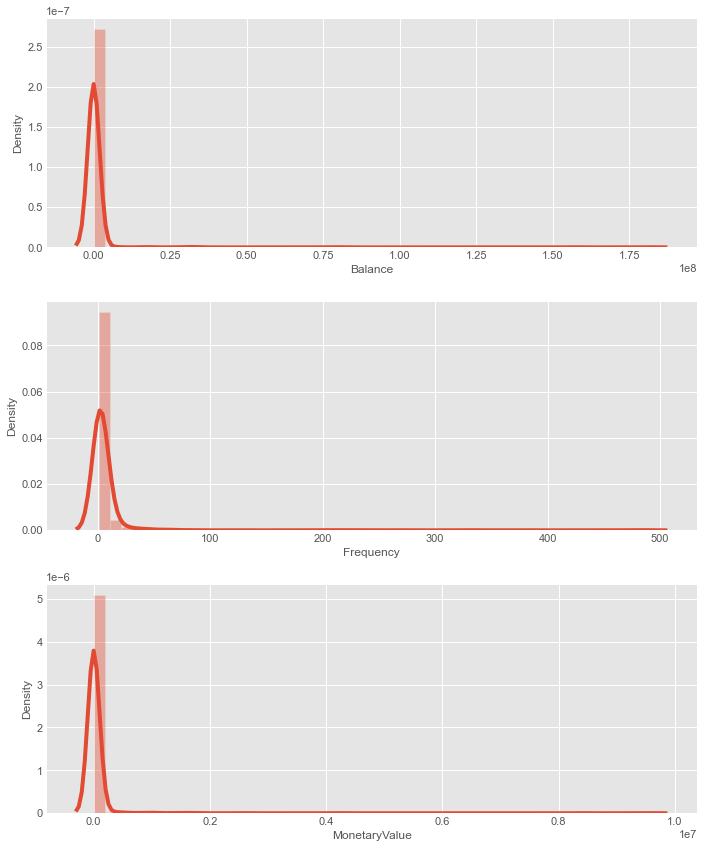

In [121]:
plt.subplots(figsize=(10, 12))

plt.subplot(3, 1, 1);
sns.distplot(bmf.Balance, label = 'Balance')

plt.subplot(3, 1, 3); 
sns.distplot(bmf.MonetaryValue, label = 'Monetary Value')

plt.subplot(3, 1, 2); 
sns.distplot(bmf.Frequency, label = 'Frequency')


plt.style.use('fivethirtyeight')
plt.tight_layout()
plt.show();

### Scale the data

In [122]:
bmf_log = bmf[['Balance', 'MonetaryValue', 'Frequency']].apply(np.log1p, 
                                                               axis = 1).round(3)

In [123]:
bmf_log

,Balance,MonetaryValue,Frequency
0,0.00000,8.23500,0.69300
1,0.00000,6.46100,0.69300
2,0.00000,9.65000,0.69300
3,0.00000,5.28000,0.69300
4,0.00000,5.96100,0.69300
...,...,...,...
1179,17.34500,11.85400,6.18800
1180,18.17400,15.25900,5.82300
1181,18.21500,13.68700,5.94000
1182,18.86900,14.28600,1.94600


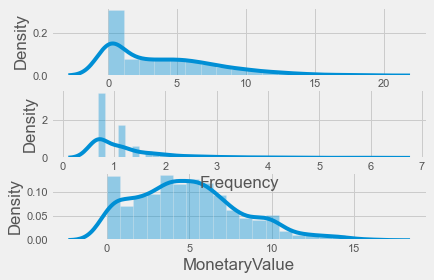

In [124]:
plt.subplot(3, 1, 1)
sns.distplot(bmf_log.Balance, label = 'Balance')

plt.subplot(3, 1, 3)
sns.distplot(bmf_log.MonetaryValue, label = 'Monetary Value')

plt.subplot(3, 1, 2)
sns.distplot(bmf_log.Frequency, label = 'Frequency')

plt.show()

In [125]:
from sklearn.preprocessing import MinMaxScaler, RobustScaler,StandardScaler

scaler = MinMaxScaler()

bmf_df_scaled = scaler.fit_transform(bmf_log)

bmf_df_scaled = pd.DataFrame(bmf_df_scaled)
bmf_df_scaled
bmf_df_scaled.columns = ['Balance', 'MonetaryValue', 'Frequency']

In [126]:
scaler = StandardScaler() 
  
# Scale data 
bmf_df_scaled = scaler.fit_transform(bmf_log)
bmf_df_scaled= pd.DataFrame(bmf_df_scaled)

In [127]:
bmf_df_scaled

,0,1,2
0,-1.00157,1.02506,-0.70104
1,-1.00157,0.47145,-0.70104
2,-1.00157,1.46664,-0.70104
3,-1.00157,0.10290,-0.70104
4,-1.00157,0.31542,-0.70104
...,...,...,...
1179,3.37861,2.15443,6.17693
1180,3.58796,3.21702,5.72006
1181,3.59831,2.72645,5.86651
1182,3.76347,2.91338,0.86731


## K-Means with BMF

In [128]:
from sklearn.cluster import KMeans
inertia = []

ks = range(1,20)

for i in ks:
    kmeans = KMeans(n_clusters= i, random_state=7)
    kmeans.fit(bmf_df_scaled)
    inertia.append(kmeans.inertia_)

In [129]:
inertia

[3552.000000000001,
 2016.3121794854294,
 1543.392727869365,
 1189.4141700777582,
 990.9947453621187,
 832.9015661713868,
 729.0992317408359,
 655.5162169234449,
 599.2270881480218,
 545.2893687060434,
 497.3314674991609,
 455.9660776151372,
 414.732571566245,
 394.0003267307611,
 377.12588390902454,
 351.62500462385447,
 334.65563602668317,
 322.5164349102547,
 307.14595869853065]

#### Elbow curve

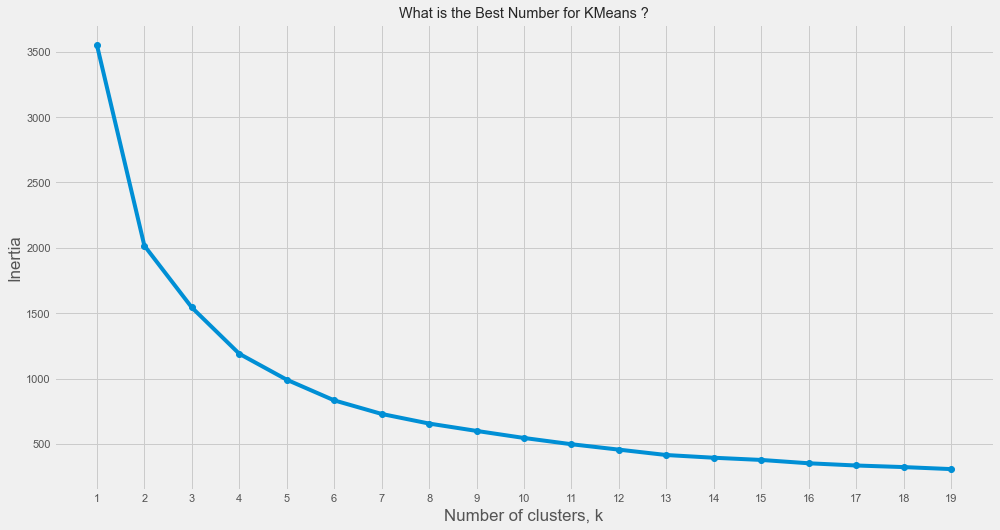

In [130]:
f, ax = plt.subplots(figsize=(15, 8))
plt.plot(ks, inertia, '-o')

plt.xlabel('Number of clusters, k')
plt.ylabel('Inertia')
plt.xticks(ks)
plt.style.use('ggplot')
plt.title('What is the Best Number for KMeans ?')
plt.show()

### Build model with selected ks

In [131]:
kmeans = KMeans(n_clusters=3, 
                max_iter=400, random_state=42)

kmeans.fit(bmf_df_scaled)

KMeans(max_iter=400, n_clusters=3, random_state=42)

In [132]:
kmeans.labels_

array([1, 2, 1, ..., 0, 0, 0], dtype=int32)

In [133]:
bmf_df_scaled['cluster_id'] = kmeans.labels_
bmf_df_scaled.head()

,0,1,2,cluster_id
0,-1.00157,1.02506,-0.70104,1
1,-1.00157,0.47145,-0.70104,2
2,-1.00157,1.46664,-0.70104,1
3,-1.00157,0.10290,-0.70104,2
4,-1.00157,0.31542,-0.70104,2


In [134]:
bmf_df_scaled.columns = ['Balance', 'MonetaryValue', 'Frequency', 'cluster_id']

In [135]:
bmf_df_scaled['cluster_id'].value_counts()

2    639
1    423
0    122
Name: cluster_id, dtype: int64

In [136]:
bmf_df['cluster_id'] = kmeans.labels_

## Visual analysis

In [137]:
def plot_clusters(df_sc, var1, var2,colors):
   
    total_clusters = df_sc.cluster_id.nunique()     
    fig = px.scatter(df_sc, x = var1, 
                 y = var2, color = df_sc.columns[len(df_sc.columns)-1], 
                     color_continuous_scale=colors)
    fig.update_layout(coloraxis_showscale=False)
    fig.show()

In [138]:
colors_clusters = ['Coral', 'DarkCyan', 'DarkSeaGreen', 
                   'Gold','Lightgreen']


In [139]:
plot_clusters(bmf_df_scaled, 'Frequency', 'Balance', colors_clusters)

In [140]:
bmf_df['cluster_id'] = kmeans.labels_

In [141]:
#Useless
#plot_clusters(bmf_df, 'Frequency', 'Balance',colors_clusters)

In [142]:
plot_clusters(bmf_df_scaled, 'Frequency', 'MonetaryValue', colors_clusters)

In [143]:
plot_clusters(bmf_df_scaled, 'Balance', 'MonetaryValue',colors_clusters)

In [144]:
mean_clusters = bmf_df.groupby('cluster_id').mean().reset_index()
mean_clusters

,cluster_id,Balance,MonetaryValue,Frequency
0,0,5855260.06668,350820.95538,39.67213
1,1,12260.49716,16241.50571,3.27896
2,2,24.72996,90.79003,1.58059


In [145]:
fig = px.bar(mean_clusters, x = 'cluster_id', 
                 y = 'MonetaryValue', color='cluster_id',
                 color_continuous_scale=  colors_clusters)

fig.update_layout(barmode ='group')

fig.show()

In [146]:
fig = px.bar(mean_clusters, x = 'cluster_id', 
                 y = 'Balance', color='cluster_id',
                 color_continuous_scale=  colors_clusters)

fig.update_layout(barmode='group')

fig.show()

In [147]:
fig = px.bar(mean_clusters, x = 'cluster_id', 
                 y = 'Frequency', color='cluster_id',
                 color_continuous_scale=  colors_clusters)

# Step 2: Update the layout of the plot
fig.update_layout(barmode='group')

fig.show()